###**NBFC Loan Default Prediction:**
**Background:**
- A non-banking financial institution (NBFI) or non-bank financial company (NBFC) is a Financial Institution that does not have a full banking license or is not supervised by a national or international banking regulatory agency. NBFC facilitates bank-related financial services, such as investment, risk pooling, contractual savings, and market brokering.

- The following is the story of a challenge faced by DHDL Ltd. (Name Changed), an NBFC in India. In recent times, the company is struggling to mark profits due to an increase in Loan Defaults. The company aims to determine the relative importance of each parameter with regards to their contribution as to whether a loan is going to default or not. Provided is a sample that contains the data of 90,000 + clients who have taken a loan from the company in the past with the information on whether the loan defaulted. 

**Goal:** 
- The goal of the problem is to predict whether a client will default on the loan payment or not. For each ID in the test_data, you must predict the “default” level.

**Datasets:**
- The problem contains two datasets, Train Data, and Test Data. Model building is to be done on Train Dataset and the Model testing is to be done on Test Dataset. The output from the Test Data is to be submitted in the Hackathon platform

**Metric to measure:**
- Your score is the percentage of all correct predictions made by you. This is simply known as accuracy. The best accuracy is 1 whereas the worst is 0. It will be calculated as the total number of two correct predictions (True positive + True negative) divided by the total number of observations in the dataset.

In [ ]:
import pandas as pd
import numpy as np
import datetime
import time

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import KNNImputer

from keras.optimizer_v2 import adam
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, BatchNormalization, LeakyReLU
from keras.initializers import Constant
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import keras

from imblearn.over_sampling import RandomOverSampler, SMOTE

import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_columns = 50

# Load the TensorBoard notebook extension
%load_ext tensorboard

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
df_train = pd.read_csv('Train_set.csv')
df_submit = pd.read_csv('Test_set.csv')
df_train.columns = df_train.columns.str.lower()
df_submit.columns = df_submit.columns.str.lower()

In [ ]:
# Examine count of each class
df_train.default.value_counts()

0    71045
1    22129
Name: default, dtype: int64

In [ ]:
# Check for data type and null values
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93174 entries, 0 to 93173
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          93174 non-null  int64  
 1   loan_amnt                   93174 non-null  int64  
 2   loan_term                   93174 non-null  object 
 3   interest_rate               93174 non-null  float64
 4   loan_grade                  93174 non-null  object 
 5   loan_subgrade               93174 non-null  object 
 6   job_experience              88472 non-null  object 
 7   home_ownership              93174 non-null  object 
 8   annual_income               93173 non-null  float64
 9   income_verification_status  93174 non-null  object 
 10  loan_purpose                93174 non-null  object 
 11  state_code                  93174 non-null  object 
 12  debt_to_income              93174 non-null  float64
 13  delinq_2yrs                 931

In [ ]:
df_submit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39933 entries, 0 to 39932
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          39933 non-null  int64  
 1   loan_amnt                   39933 non-null  int64  
 2   loan_term                   39933 non-null  object 
 3   interest_rate               39933 non-null  float64
 4   loan_grade                  39933 non-null  object 
 5   loan_subgrade               39933 non-null  object 
 6   job_experience              37844 non-null  object 
 7   home_ownership              39933 non-null  object 
 8   annual_income               39933 non-null  float64
 9   income_verification_status  39933 non-null  object 
 10  loan_purpose                39933 non-null  object 
 11  state_code                  39933 non-null  object 
 12  debt_to_income              39933 non-null  float64
 13  delinq_2yrs                 399

In [ ]:
df_train.isnull().sum()[lambda x: x>0]

job_experience           4702
annual_income               1
delinq_2yrs                 2
public_records              2
total_acc                   2
last_week_pay            1924
total_current_balance    7386
total_revolving_limit    7386
utilization              7420
bal_per_acc              7386
dtype: int64

In [ ]:
df_submit.isnull().sum()[lambda x: x>0]

job_experience           2089
delinq_2yrs                 1
public_records              1
total_acc                   1
last_week_pay             806
total_current_balance    3230
total_revolving_limit    3230
dtype: int64

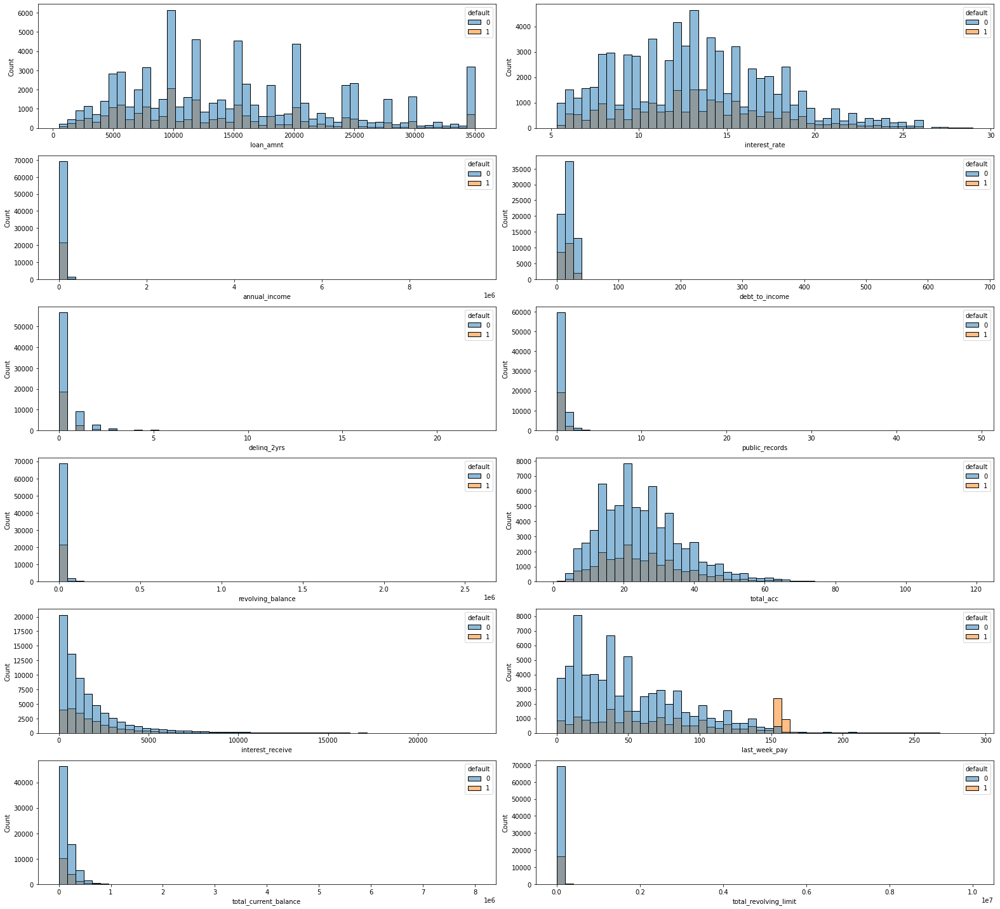

In [ ]:
# Plot distribution of numerical variables
plt.figure(figsize=(22,20))
cols = [item for item in df_train.select_dtypes(include=['int','float']).columns.to_list() if item not in ['id','default']]

for i, col in enumerate(cols):
  plt.subplot(6,2,i+1)
  sns.histplot(data=df_train, x=col, hue='default', bins=50)
plt.tight_layout()
plt.show()

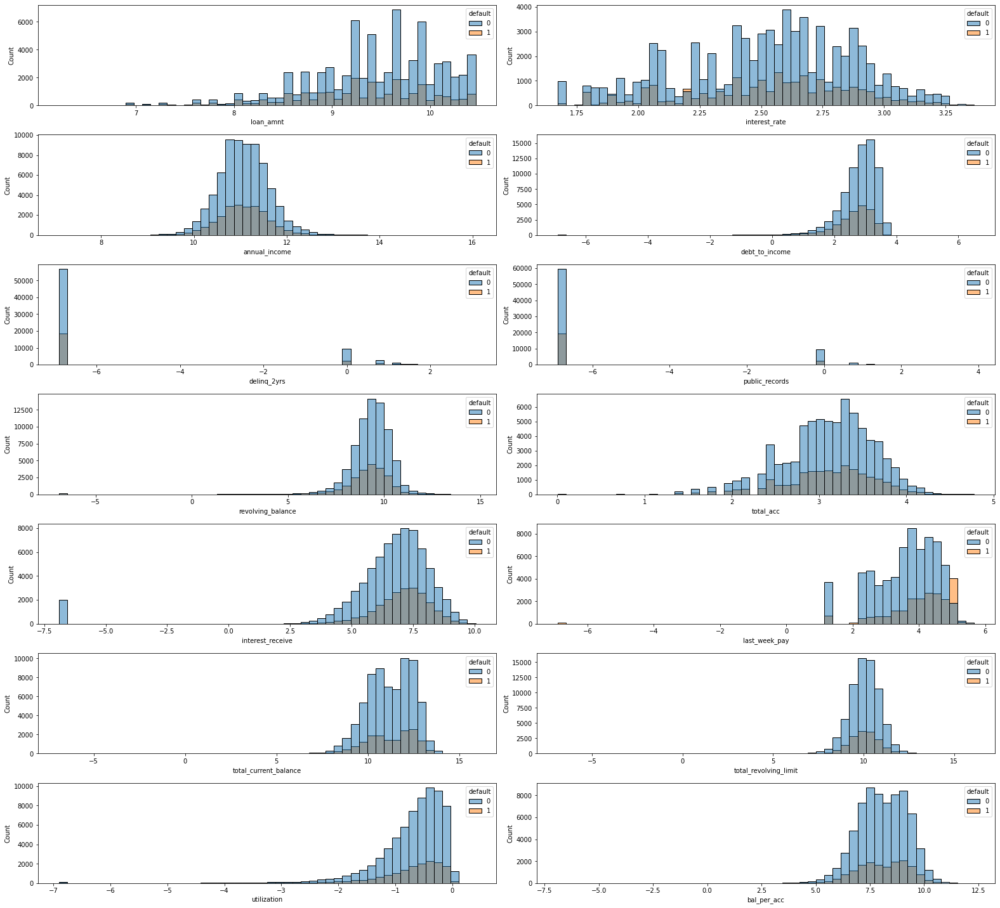

In [ ]:
# Perform log transformation to reduce skewness and re-examine data distribution
df_train['utilization'] = df_train['revolving_balance'] / df_train['total_revolving_limit']
df_train['bal_per_acc'] = df_train['total_current_balance'] / df_train['total_acc']

# List of numerical columns
cols = [item for item in df_train.select_dtypes(include=['int','float']).columns.to_list() if item not in ['id','default']]

# Log transformation
df_train[cols] = df_train[cols].apply(lambda x: np.log(x+0.001))

plt.figure(figsize=(22,20))
for i, col in enumerate(cols):
  plt.subplot(7,2,i+1)
  sns.histplot(data=df_train, x=col, hue='default', bins=50)
plt.tight_layout()
plt.show()

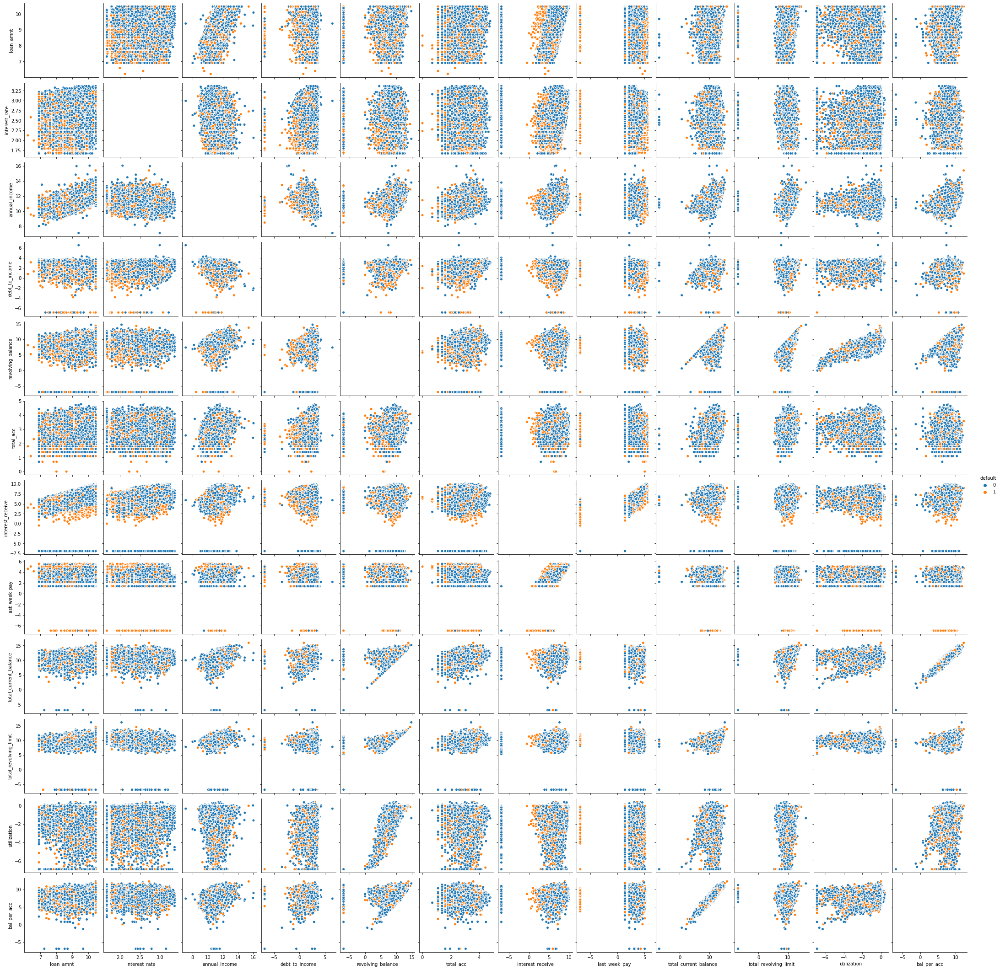

In [ ]:
cols = [item for item in df_train.select_dtypes(include=['int','float']).columns.to_list() if item not in ['id','delinq_2yrs','public_records']]
df_plot = df_train[cols]
sns.pairplot(df_plot, hue='default', kind='scatter', diag_kind='None', corner=False, plot_kws=dict(marker='o',linewidth=1))

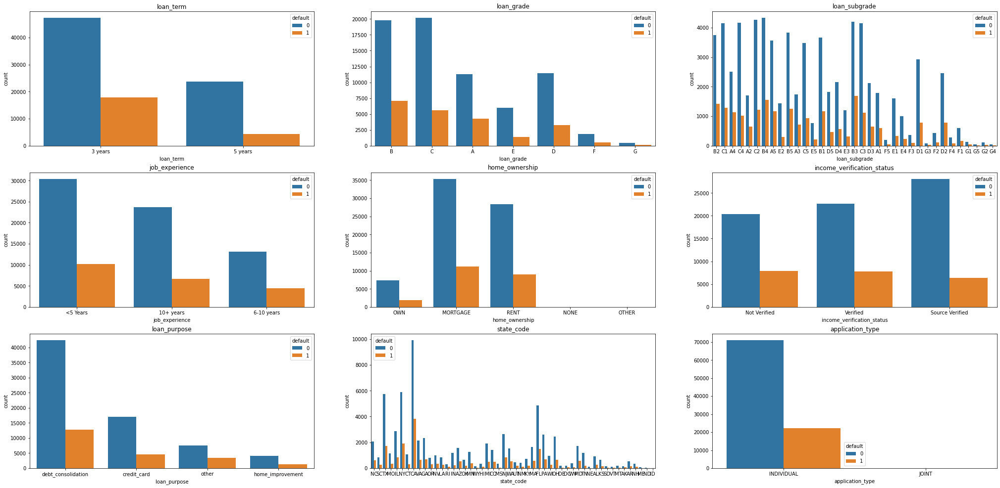

In [ ]:
# Visualize categorical variables
cat_cols = df_train.select_dtypes(include='object').columns

plt.figure(figsize=(35,17))
for i, col in enumerate(cat_cols):
  plt.subplot(3,3,i+1)
  sns.countplot(data=df_train, x=col, hue='default')
  plt.title(col)
plt.show()

(75.0, 175.0)

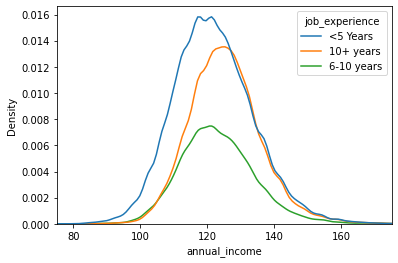

In [ ]:
# Does higher job_experience mean higher annual income?
sns.kdeplot(data=df_train, x='annual_income', hue='job_experience')
plt.xlim([75,175])

In [ ]:
# Create function to score results
def scores(data):
  accuracy = (data.TN + data.TP ) / data.iloc[0].sum()
  recall = data.TP / (data.TP + data.FN)
  precision = data.TP / (data.TP + data.FP)
  f1_score = 2*precision*recall / (precision+recall)
  print('Accuracy: ',round(accuracy.values[0],4))
  print('Recall: ',round(recall.values[0],4))
  print('Precision: ',round(precision.values[0],4))
  print('F1 Score: ',round(f1_score.values[0],4))

# Create confusion matrix
def conf_matrix(x_var, y_var):
  y_pred = model.predict(x_var).round()
  cm = confusion_matrix(y_var,y_pred).ravel()
  cm_df = pd.DataFrame(columns=['TN','FP','FN','TP'], data=cm.reshape(1,4))
  print(cm_df)
  print('')
  scores(cm_df)

# Features engineering: flag important thresholds 
def feat_eng(data_df):
    data_df['no_lwp'] = np.where(data_df.last_week_pay.lt(-5),1,0)
    data_df['no_int_rec'] = np.where(data_df.interest_receive.lt(-5),1,0)
    data_df['no_tot_rev_lim'] = np.where(data_df.total_revolving_limit.lt(-5),1,0)
    data_df['no_rev_bal'] = np.where(data_df.revolving_balance.lt(-5),1,0)
    data_df['no_cur_bal'] = np.where(data_df.total_current_balance.lt(-5),1,0)
    data_df['income_outliers'] = np.where(data_df.annual_income.lt(9) | data_df.annual_income.gt(13), 1, 0)
    data_df['no_dti'] = np.where(data_df.debt_to_income.lt(-5),1,0)
    return data_df
    
# Reload data
df_train = pd.read_csv('Train_set.csv')
df_submit = pd.read_csv('Test_set.csv')

# Concat train and submission set to ensure identical structures
df = pd.concat([df_train,df_submit])
df.columns = df.columns.str.lower()

# Create 2 new features
df['utilization'] = df['revolving_balance'] / df['total_revolving_limit']
df['bal_per_acc'] = df['total_current_balance'] / df['total_acc']

# Select columns for log transformation
num_cols = [item for item in df.select_dtypes(include=['int','float']).columns.to_list() if item not in ['id','default','delinq_2yrs','public_records']]
df[num_cols] = df[num_cols].apply(lambda x: np.log(x+0.001))

# Group states with less than 1000 applications into 1 group
state_list = df.state_code.value_counts()[lambda x: x<1000].index.values
for s in state_list:
  df['state_code'].replace({s:'Other'}, inplace=True)

# More regrouping
df['home_ownership'].replace({'NONE':'RENT','OTHER':'RENT'}, inplace=True)
df['delq_group'] = np.select([df.delinq_2yrs.eq(0), df.delinq_2yrs.eq(1), df.delinq_2yrs.eq(2)],['Never','One','Two'],'>2')
df['public_records_group'] = np.select([df.public_records.eq(0), df.public_records.eq(1)],['Never','One'],'>1')
df.drop(columns=['id','delinq_2yrs','public_records','job_experience','application_type'], inplace=True)

# One-hot encoding
cat_cols = [item for item in df.select_dtypes(include=['object']).columns.to_list()]
df_encoded = pd.get_dummies(df, columns=cat_cols)

# Define train data set
df_train_encoded = df_encoded[df_encoded.default.notnull()]

# Separate dependent from independent variables
x = df_train_encoded.drop(columns='default')
y = df_train_encoded[['default']]

# Split train data set into test and cv
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.4, random_state=23)
x_test, x_cv, y_test, y_cv = train_test_split(x_test, y_test, test_size=0.5, random_state=23)

# Impute missing values
imputer = KNNImputer(n_neighbors=5)
x_train_imputed = pd.DataFrame(data=imputer.fit_transform(x_train), columns=x_train.columns)
x_test_imputed = pd.DataFrame(data=imputer.transform(x_test), columns=x_test.columns)
x_cv_imputed = pd.DataFrame(data=imputer.transform(x_cv), columns=x_cv.columns)

# Feature engineer data
for n in [x_train_imputed, x_test_imputed, x_cv_imputed]: n = feat_eng(n)

# Upsample imbalanced dataset
resampler = SMOTE(random_state=12, k_neighbors=5)
x_train_up, y_train_up = resampler.fit_resample(x_train_imputed, y_train)
x_train_up = pd.DataFrame(data=x_train_up, columns=x_train_imputed.columns)

# Round up upsampled binary features
eng_features = ['no_lwp','no_int_rec','no_tot_rev_lim','no_rev_bal','no_cur_bal','income_outliers','no_dti']
for n in [x_train_up, x_cv_imputed, x_test_imputed]: n[eng_features] = n[eng_features].round()

# Standardize only non-binary data, clip at 7 stdev
scaler = StandardScaler()
x_train_up[num_cols] = np.clip(scaler.fit_transform(x_train_up[num_cols].values), -7, 7)
x_cv_imputed[num_cols] = np.clip(scaler.transform(x_cv_imputed[num_cols].values), -7, 7)
x_test_imputed[num_cols] = np.clip(scaler.transform(x_test_imputed[num_cols].values), -7, 7)

In [ ]:
# # Build and fit model
# model = Sequential([Dense(128, input_shape=(x_train_up.shape[1],)),LeakyReLU(), BatchNormalization(),
#                     Dense(64),LeakyReLU(), BatchNormalization(),
#                     Dense(64),LeakyReLU(), BatchNormalization(),
#                     Dense(32),LeakyReLU(), BatchNormalization(),
#                     Dense(32),LeakyReLU(), BatchNormalization(),
#                     Dense(16),LeakyReLU(), BatchNormalization(),
#                     Dense(16),LeakyReLU(), BatchNormalization(),
#                     Dense(8),LeakyReLU(), BatchNormalization(),
#                     Dense(8),LeakyReLU(), BatchNormalization(),
#                     Dense(1, activation='sigmoid',bias_initializer=Constant(0))
# ])

# model.compile(optimizer='adam', loss='binary_crossentropy', metrics='accuracy')

In [ ]:
# Clear TensorBoard logs
%rm -rf ./logs/
# Set up TensorBoard
name = 'NN-128x1x64x2x32x2x16x2x12x2-{}'.format(datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs/{}".format(name), histogram_freq=1)
%tensorboard --logdir logs

In [ ]:
# Load and continue training model
model = keras.models.load_model('128x64x2x32x2x16x2x8x2.h5')

In [ ]:
# Load and continue training model
model = keras.models.load_model('128x64x2x32x2x16x2x8x2.h5')

hist = model.fit(x_train_up.values, y_train_up, batch_size=5, epochs=200
                ,validation_data=(x_cv_imputed.values, y_cv.values.reshape(y_cv.shape[0]))
                ,verbose=False, callbacks=[tensorboard_callback])

<IPython.core.display.Javascript object>

In [ ]:
model.save('128x64x2x32x2x16x2x8x2.h5')

In [ ]:
print('Base line accuracy for cv set: ',1-(y_cv.value_counts().values[1] / len(y_cv)))
print('Base line accuracy for test set: ',1-(y_test.value_counts().values[1] / len(y_test)))

print('*************Train*************')
conf_matrix(x_train_up, y_train_up)
print('*************Validation*************')
conf_matrix(x_cv_imputed, y_cv)
print('*************Test*************')
conf_matrix(x_test_imputed, y_test)

Base line accuracy for cv set:  0.7655486986852696
Base line accuracy for test set:  0.7590555406493158
*************Train*************
      TN    FP    FN     TP
0  39694  2940  6676  35958

Accuracy:  0.8872
Recall:  0.8434
Precision:  0.9244
F1 Score:  0.8821
*************Validation*************
      TN    FP    FN    TP
0  13108  1158  1535  2834

Accuracy:  0.8555
Recall:  0.6487
Precision:  0.7099
F1 Score:  0.6779
*************Test*************
      TN    FP    FN    TP
0  13040  1105  1617  2873

Accuracy:  0.8539
Recall:  0.6399
Precision:  0.7222
F1 Score:  0.6786


### Error Analysis

In [ ]:
y_pred = model.predict(x_test_imputed)
x_test_imputed['pred'] = np.round(y_pred)
x_test_imputed['actual'] = y_test.values
x_test_imputed['results'] = np.select([x_test_imputed.actual.eq(1)&x_test_imputed.pred.eq(1),
                                       x_test_imputed.actual.eq(1)&x_test_imputed.pred.eq(0),
                                       x_test_imputed.actual.eq(0)&x_test_imputed.pred.eq(0),
                                       x_test_imputed.actual.eq(0)&x_test_imputed.pred.eq(1)],
                                      ['TP','FP','TN','FN'])

In [ ]:
x_test_imputed.results.value_counts()

TN    13040
TP     2873
FP     1617
FN     1105
Name: results, dtype: int64

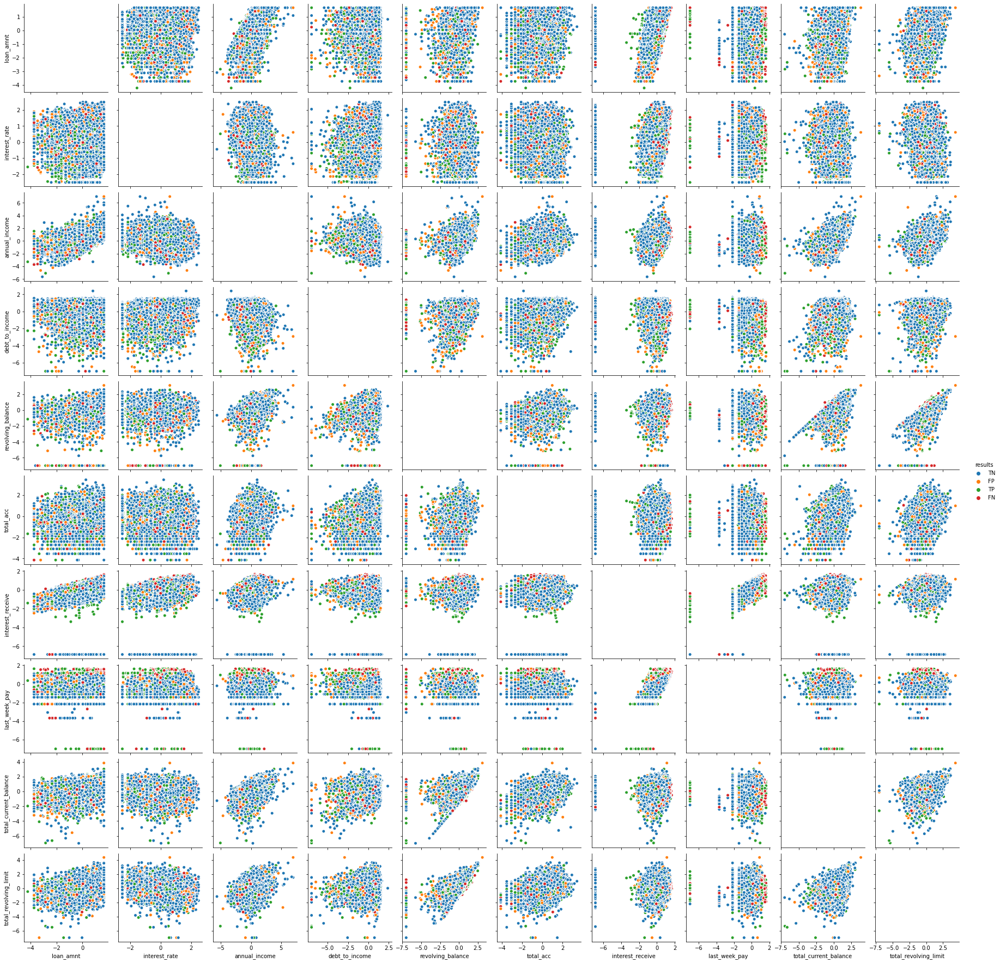

In [ ]:
cols = [item for item in df_train.select_dtypes(include=['int','float']).columns.to_list() if item not in ['ID','delinq_2yrs','public_records','default']]
cols.append('results')
plot_data = x_test_imputed[cols]
sns.pairplot(plot_data, hue='results', kind='scatter', diag_kind='None', corner=False, plot_kws=dict(marker='o',linewidth=1))

In [ ]:
plot_data[plot_data.revolving_balance.lt(-6)].results.value_counts()

TN    25
TP    16
FP    13
FN    13
Name: results, dtype: int64

In [ ]:
def plot_3d(d1,d2,d3):
  fig = plt.figure(figsize=(10,10))
  ax = fig.add_subplot(111, projection='3d')
  cdict = {'TN':'blue','TP':'green','FN':'red','FP':'orange'}
  for r in plot_data.results.unique():
    ax.scatter(plot_data[d1][plot_data.results.eq(r)], plot_data[d2][plot_data.results.eq(r)], plot_data[d3][plot_data.results.eq(r)], label=r, c=cdict[r],s= 8)
  ax.set_xlabel(d1)
  ax.set_ylabel(d2)
  ax.set_zlabel(d3)
  ax.legend()

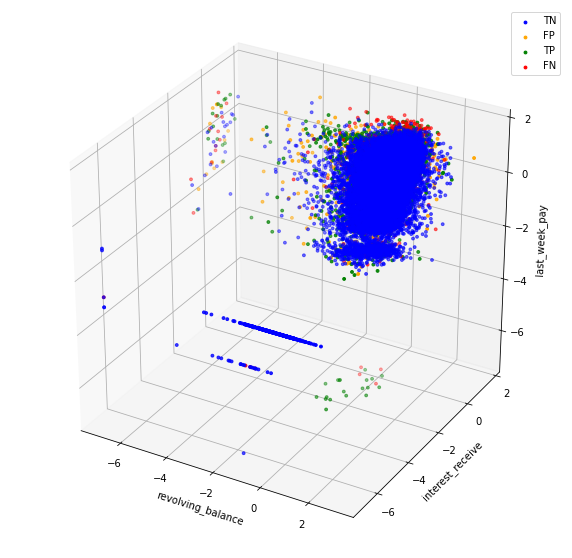

In [ ]:
plot_3d('revolving_balance','interest_receive', 'last_week_pay')